In [1]:
##pip install tensorflow


In [2]:
import tensorflow as tf

# View TensorFlow version
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.13.0


In [3]:
##pip install librosa
#necessary for extracting features of audio signals

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import os
#library that performs attribute processing
import librosa
import numpy as np

from tqdm import tqdm

In [5]:
##pip install --upgrade numpy


In [6]:
##pip install --upgrade tensorflow


In [7]:
from sklearn.model_selection import train_test_split

In [8]:

from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential

from tensorflow.keras.optimizers import Adam

In [9]:
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten


In [10]:
from sklearn import metrics
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

In [11]:
import librosa


In [12]:
##pip install soundfile


In [13]:
##pip install nbformat --upgrade


In [14]:
audio_file_path = "C:\\Users\\gulcin.colasan\\Desktop\\CCT Pyhon\\assesment_BigData\\UrbanSound\\fold1\\202516.wav "
#digitizing the audio file
librosa_audio_data, librosa_sample_rate = librosa.load(audio_file_path)


In [15]:
print(librosa_audio_data)

[-7.4454697e-06 -3.7709255e-05 -5.9196696e-05 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00]


In [16]:
librosa_audio_data.shape

(587245,)

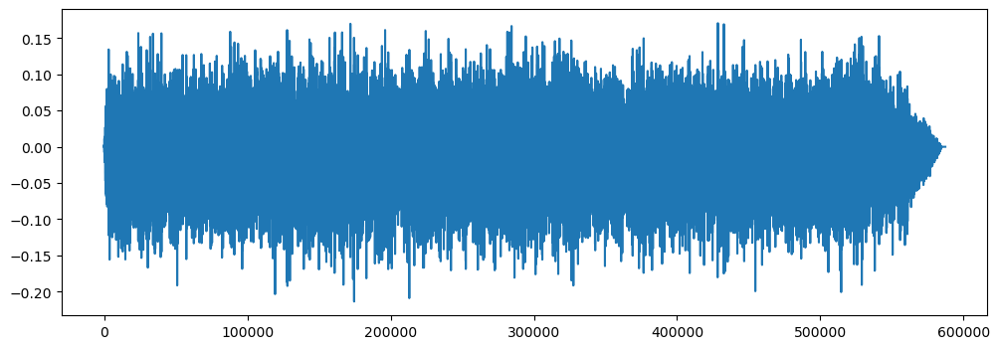

In [17]:
plt.figure(figsize=(12,4))
plt.plot(librosa_audio_data)
plt.show()

In [18]:
from IPython.display import Audio
Audio("C:\\Users\\gulcin.colasan\\Desktop\\CCT Pyhon\\assesment_BigData\\UrbanSound\\fold1\\202516.wav") 

In [19]:
mfccs=librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40) #Feature Selection

In [20]:
mfccs.shape

(40, 1147)

In [21]:
mfccs

array([[-4.4973776e+02, -3.6431342e+02, -3.1289420e+02, ...,
        -7.0158905e+02, -7.0158905e+02, -7.0158905e+02],
       [ 1.5885954e+02,  1.6173245e+02,  1.5932523e+02, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-2.0546036e+00, -2.4717643e+00, -4.4279966e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [ 1.0843599e+00, -2.1393816e+00, -2.1451497e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 5.5367131e+00,  1.4043086e+00,  3.8419312e-01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 7.5321002e+00,  7.9810357e+00,  1.1683311e+01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

In [22]:
audio_dataset_path = "C:\\Users\\gulcin.colasan\\Desktop\\CCT Pyhon\\assesment_BigData\\UrbanSound\\"

In [23]:
metadata=pd.read_csv("UrbanSound8K.csv")
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,121286.wav,121286,0.0,0.33,1,1,0,air_conditioner
1,202516.wav,202516,0.0,0.26,1,1,0,air_conditioner
2,121285.wav,121285,0.0,0.22,1,1,0,air_conditioner
3,185709.wav,185709,0.0,0.20,1,1,0,air_conditioner
4,47160.wav,47160,0.0,0.17,1,1,0,air_conditioner


In [24]:
##pip install resampy


In [25]:
audio_dataset_path = "C:/Users/gulcin.colasan/Desktop/CCT Pyhon/assesment_BigData"

metadata = pd.read_csv("UrbanSound8K.csv")
metadata.head()

def feature_extractor(file):
    audio, sample_rate = librosa.load(file, res_type="kaiser_fast")
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features.T, axis=0)
    
    return mfccs_scaled_features

extracted_features = []
for index_num, row in tqdm(metadata.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_dataset_path), "fold" + str(row["fold"]) + "/", str(row["slice_file_name"]))
    final_class_labels = row["class"]
    data = feature_extractor(file_name)
    extracted_features.append([data, final_class_labels])


490it [01:27,  5.59it/s]


In [26]:
extracted_features_df=pd.DataFrame(extracted_features,columns=["features","class"])
extracted_features_df.head()

,features,class
0,"[-96.229355, 148.2959, -44.139, 3.572688, -22....",air_conditioner
1,"[-243.77872, 168.21906, -14.65459, 37.02061, -...",air_conditioner
2,"[-113.740685, 153.07578, -46.491844, 3.0324051...",air_conditioner
3,"[-480.09467, 155.51509, 16.99086, 40.1466, 4.7...",air_conditioner
4,"[-160.20427, 131.8437, 4.107221, 28.135288, -1...",air_conditioner


In [27]:
extracted_features_df.tail()

,features,class
485,"[-314.74966, 147.60992, -16.463661, 38.422325,...",steet_music
486,"[-113.77406, 100.90458, -39.64244, 31.526463, ...",steet_music
487,"[-250.92215, 109.773674, -35.04721, 25.160814,...",steet_music
488,"[-165.47856, 146.83524, -53.908875, 28.78846, ...",steet_music
489,"[-385.70938, 163.67618, 28.19967, -9.6659565, ...",steet_music


In [28]:
x=np.array(extracted_features_df["features"].tolist())
y=np.array(extracted_features_df["class"].tolist())

In [29]:
x.shape

(490, 40)

In [30]:
y.shape

(490,)

In [31]:
labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

In [32]:
y

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [33]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=0)

In [34]:
xtrain

array([[-2.0021771e+02,  1.3225052e+02, -9.2231895e+01, ...,
        -4.6046295e+00, -9.7299290e-01, -3.3730049e+00],
       [-3.7585547e+02,  1.0714752e+02,  1.3884131e+01, ...,
        -1.3546560e+00, -3.0950537e+00, -1.6925420e+00],
       [-3.7308853e+02,  4.2395683e+01, -1.4298908e+01, ...,
         1.8582919e-01, -4.7631092e-02,  3.2837901e-01],
       ...,
       [-4.1584229e+02,  7.6041985e+01, -1.2357228e+00, ...,
         1.4190130e+00,  1.4863416e+00,  1.0524710e+00],
       [-3.5439575e+02,  1.0312005e+02, -3.2543636e+01, ...,
        -1.6496764e+00, -1.0094262e+01, -4.9224548e+00],
       [-4.4593561e+02,  8.0890701e+01,  1.5445086e+01, ...,
        -1.2280923e+00, -2.3837328e+00,  2.5855476e-02]], dtype=float32)

In [35]:
num_labels=10

In [36]:
model=Sequential()
model.add(Dense(125,input_shape=(40,)))
model.add(Activation("relu"))
model.add(Dropout(0.5))
#2. hide
model.add(Dense(250))
model.add(Activation("relu"))
model.add(Dropout(0.5))
#3hide
model.add(Dense(125))
model.add(Activation("relu"))
model.add(Dropout(0.5))
#output
model.add(Dense(num_labels))
model.add(Activation("softmax"))

In [37]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 125)               5125      
                                                                 
 activation (Activation)     (None, 125)               0         
                                                                 
 dropout (Dropout)           (None, 125)               0         
                                                                 
 dense_1 (Dense)             (None, 250)               31500     
                                                                 
 activation_1 (Activation)   (None, 250)               0         
                                                                 
 dropout_1 (Dropout)         (None, 250)               0         
                                                                 
 dense_2 (Dense)             (None, 125)               3

In [38]:
model.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer="adam")

In [39]:
epochscount=300
num_batch_size=32

In [40]:
model.fit(xtrain,ytrain,batch_size=num_batch_size,epochs=epochscount,validation_data=(xtest,ytest),verbose=1)

Epoch 1/300
13/13 [==============================] - 2s 31ms/step - loss: 54.4434 - accuracy: 0.1071 - val_loss: 9.2146 - val_accuracy: 0.1939
Epoch 2/300
13/13 [==============================] - 0s 13ms/step - loss: 28.8858 - accuracy: 0.1862 - val_loss: 4.1911 - val_accuracy: 0.1122
Epoch 3/300
13/13 [==============================] - 0s 9ms/step - loss: 20.6713 - accuracy: 0.1913 - val_loss: 3.0997 - val_accuracy: 0.2959
Epoch 4/300
13/13 [==============================] - 0s 10ms/step - loss: 15.5057 - accuracy: 0.1403 - val_loss: 2.2846 - val_accuracy: 0.2857
Epoch 5/300
13/13 [==============================] - 0s 10ms/step - loss: 11.4699 - accuracy: 0.2066 - val_loss: 1.9071 - val_accuracy: 0.3061
Epoch 6/300
13/13 [==============================] - 0s 5ms/step - loss: 9.8506 - accuracy: 0.1684 - val_loss: 1.9352 - val_accuracy: 0.2755
Epoch 7/300
13/13 [==============================] - 0s 6ms/step - loss: 8.1472 - accuracy: 0.2092 - val_loss: 1.9570 - val_accuracy: 0.2449
Epoc

Epoch 59/300
13/13 [==============================] - 0s 5ms/step - loss: 2.0154 - accuracy: 0.2908 - val_loss: 1.9309 - val_accuracy: 0.3367
Epoch 60/300
13/13 [==============================] - 0s 5ms/step - loss: 2.0126 - accuracy: 0.2857 - val_loss: 1.9148 - val_accuracy: 0.3367
Epoch 61/300
13/13 [==============================] - 0s 6ms/step - loss: 2.0272 - accuracy: 0.2934 - val_loss: 1.9089 - val_accuracy: 0.3367
Epoch 62/300
13/13 [==============================] - 0s 6ms/step - loss: 1.9332 - accuracy: 0.2883 - val_loss: 1.8933 - val_accuracy: 0.3367
Epoch 63/300
13/13 [==============================] - 0s 5ms/step - loss: 2.0504 - accuracy: 0.2832 - val_loss: 1.8920 - val_accuracy: 0.3367
Epoch 64/300
13/13 [==============================] - 0s 6ms/step - loss: 2.0053 - accuracy: 0.3036 - val_loss: 1.9048 - val_accuracy: 0.3367
Epoch 65/300
13/13 [==============================] - 0s 6ms/step - loss: 1.9818 - accuracy: 0.2883 - val_loss: 1.9231 - val_accuracy: 0.3367
Epoch 

13/13 [==============================] - 0s 6ms/step - loss: 1.7765 - accuracy: 0.3393 - val_loss: 1.6993 - val_accuracy: 0.3571
Epoch 117/300
13/13 [==============================] - 0s 6ms/step - loss: 1.7211 - accuracy: 0.3571 - val_loss: 1.6913 - val_accuracy: 0.3673
Epoch 118/300
13/13 [==============================] - 0s 6ms/step - loss: 1.7013 - accuracy: 0.3750 - val_loss: 1.7001 - val_accuracy: 0.3673
Epoch 119/300
13/13 [==============================] - 0s 6ms/step - loss: 1.7129 - accuracy: 0.3750 - val_loss: 1.7186 - val_accuracy: 0.3673
Epoch 120/300
13/13 [==============================] - 0s 6ms/step - loss: 1.7361 - accuracy: 0.3546 - val_loss: 1.7096 - val_accuracy: 0.3571
Epoch 121/300
13/13 [==============================] - 0s 6ms/step - loss: 1.7169 - accuracy: 0.3546 - val_loss: 1.7058 - val_accuracy: 0.3673
Epoch 122/300
13/13 [==============================] - 0s 6ms/step - loss: 1.6840 - accuracy: 0.3776 - val_loss: 1.6863 - val_accuracy: 0.3673
Epoch 123/300

13/13 [==============================] - 0s 6ms/step - loss: 1.4514 - accuracy: 0.4821 - val_loss: 1.6380 - val_accuracy: 0.4490
Epoch 174/300
13/13 [==============================] - 0s 6ms/step - loss: 1.4126 - accuracy: 0.4847 - val_loss: 1.6471 - val_accuracy: 0.4490
Epoch 175/300
13/13 [==============================] - 0s 6ms/step - loss: 1.4016 - accuracy: 0.4745 - val_loss: 1.6623 - val_accuracy: 0.4592
Epoch 176/300
13/13 [==============================] - 0s 6ms/step - loss: 1.4243 - accuracy: 0.5102 - val_loss: 1.6464 - val_accuracy: 0.4694
Epoch 177/300
13/13 [==============================] - 0s 6ms/step - loss: 1.3922 - accuracy: 0.4668 - val_loss: 1.6419 - val_accuracy: 0.4694
Epoch 178/300
13/13 [==============================] - 0s 6ms/step - loss: 1.3933 - accuracy: 0.4796 - val_loss: 1.6624 - val_accuracy: 0.4694
Epoch 179/300
13/13 [==============================] - 0s 6ms/step - loss: 1.4029 - accuracy: 0.5051 - val_loss: 1.7068 - val_accuracy: 0.4694
Epoch 180/300

13/13 [==============================] - 0s 7ms/step - loss: 1.1800 - accuracy: 0.5689 - val_loss: 1.4901 - val_accuracy: 0.5918
Epoch 231/300
13/13 [==============================] - 0s 7ms/step - loss: 1.1238 - accuracy: 0.5612 - val_loss: 1.4709 - val_accuracy: 0.5714
Epoch 232/300
13/13 [==============================] - 0s 7ms/step - loss: 1.1127 - accuracy: 0.5944 - val_loss: 1.4619 - val_accuracy: 0.6020
Epoch 233/300
13/13 [==============================] - 0s 8ms/step - loss: 1.2078 - accuracy: 0.6046 - val_loss: 1.4995 - val_accuracy: 0.5816
Epoch 234/300
13/13 [==============================] - 0s 6ms/step - loss: 1.1503 - accuracy: 0.5740 - val_loss: 1.4852 - val_accuracy: 0.5714
Epoch 235/300
13/13 [==============================] - 0s 7ms/step - loss: 1.1882 - accuracy: 0.6097 - val_loss: 1.4481 - val_accuracy: 0.5510
Epoch 236/300
13/13 [==============================] - 0s 6ms/step - loss: 1.1038 - accuracy: 0.5918 - val_loss: 1.4512 - val_accuracy: 0.5714
Epoch 237/300

13/13 [==============================] - 0s 6ms/step - loss: 0.8423 - accuracy: 0.6760 - val_loss: 1.4479 - val_accuracy: 0.5612
Epoch 288/300
13/13 [==============================] - 0s 6ms/step - loss: 0.8469 - accuracy: 0.6811 - val_loss: 1.4819 - val_accuracy: 0.6020
Epoch 289/300
13/13 [==============================] - 0s 6ms/step - loss: 0.9243 - accuracy: 0.6735 - val_loss: 1.4641 - val_accuracy: 0.6020
Epoch 290/300
13/13 [==============================] - 0s 5ms/step - loss: 0.8308 - accuracy: 0.7041 - val_loss: 1.4408 - val_accuracy: 0.6020
Epoch 291/300
13/13 [==============================] - 0s 6ms/step - loss: 0.8326 - accuracy: 0.7296 - val_loss: 1.4615 - val_accuracy: 0.5816
Epoch 292/300
13/13 [==============================] - 0s 6ms/step - loss: 0.8645 - accuracy: 0.6964 - val_loss: 1.4370 - val_accuracy: 0.6020
Epoch 293/300
13/13 [==============================] - 0s 6ms/step - loss: 0.8582 - accuracy: 0.6786 - val_loss: 1.4284 - val_accuracy: 0.6020
Epoch 294/300

In [41]:
validation_test_set_accuracy=model.evaluate(xtest,ytest,verbose=0)
print(validation_test_set_accuracy[1])

0.6122449040412903


In [42]:
xtest[1]

array([-1.91733551e+02,  4.66133881e+01, -5.95363426e+01,  2.22732353e+01,
       -2.65579200e+00,  1.47801762e+01, -9.66454601e+00,  2.46882362e+01,
       -5.33018780e+00,  1.83059387e+01, -5.54741621e+00,  3.60464501e+00,
       -1.05511532e+01, -1.40778410e+00,  2.49280676e-01,  1.34370775e+01,
       -3.81220889e+00,  1.03961582e+01, -1.39538670e+01,  9.07770824e+00,
       -8.26522732e+00,  6.31005287e+00, -2.93271804e+00,  4.80100870e+00,
       -3.39573413e-01,  4.22169417e-01, -2.06614017e+00,  3.19491029e+00,
       -5.43365097e+00,  3.23190045e+00, -1.87972939e+00, -4.57165241e-01,
       -1.14570212e+00, -8.83604825e-01, -1.48400533e+00,  9.39919829e-01,
       -7.84644425e-01,  1.51101601e+00, -2.17823818e-01, -1.29777268e-01],
      dtype=float32)

In [44]:
filename="fold6/78651.wav"
sound_signal,sample_rate=librosa.load(filename,res_type="kaiser_fast")
mfcc_features=librosa.feature.mfcc(y=sound_signal,sr=sample_rate,n_mfcc=40)
mfccs_scaled_features=np.mean(mfcc_features.T,axis=0)

In [45]:
mfccs_scaled_features

array([-150.81165   ,   95.596634  ,  -20.53293   ,   41.750793  ,
          4.514963  ,   41.31136   ,   11.9838295 ,   10.095367  ,
        -20.985662  ,   10.4570265 ,   10.738673  ,   21.367168  ,
        -21.980917  ,    1.1205679 ,  -15.439524  ,    5.38005   ,
         -1.2099222 ,    5.921883  ,   -9.688701  ,    8.30707   ,
         -3.1453035 ,    0.84331244,   -8.060562  ,    8.337427  ,
         -6.4592366 ,    7.6821876 ,  -10.570008  ,    4.741222  ,
         -2.4219704 ,   -3.809564  ,   -3.8714168 ,    1.9959724 ,
         -8.319535  ,    2.6635468 ,   -1.7602565 ,    2.1441674 ,
          1.7928824 ,    5.1099195 ,    1.3983108 ,   -2.0781    ],
      dtype=float32)

In [46]:
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)

In [47]:
mfccs_scaled_features.shape

(1, 40)

In [48]:
result_array=model.predict(mfccs_scaled_features)

1/1 [==============================] - 0s 117ms/step


In [49]:
result_array

array([[0.05533798, 0.2503458 , 0.00245431, 0.02151627, 0.0024254 ,
        0.5356259 , 0.00195715, 0.02983344, 0.08184918, 0.01865454]],
      dtype=float32)

In [50]:
result_classes=["air conditioner","car horn","children playing","dog bark","drilling","engine idling","gun shot",
                "jackhammer","siren","street music"]

In [51]:
result_classes

['air conditioner',
 'car horn',
 'children playing',
 'dog bark',
 'drilling',
 'engine idling',
 'gun shot',
 'jackhammer',
 'siren',
 'street music']

In [52]:
result=np.argmax(result_array[0])

In [53]:
result_classes[result]

'engine idling'

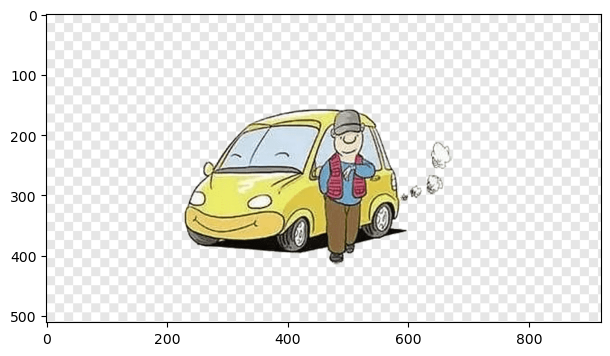

In [55]:
if result_classes[result]=='dog bark':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('dog_bark_png.png')
    imgplot=plt.imshow(img)
    plt.show()
if result_classes[result]=='air conditioner':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('air_conditioner_png.png')
    imgplot=plt.imshow(img)
    plt.show()
if result_classes[result]=='car horn':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('car_horn_png.png')
    imgplot=plt.imshow(img)
    plt.show()
if result_classes[result]=='drilling':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('drilling_png.png')
    imgplot=plt.imshow(img)
    plt.show()  
if result_classes[result]=='children playing':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('children_playing_png.png')
    imgplot=plt.imshow(img)
    plt.show()  
if result_classes[result]=='engine idling':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('engine_idling_png.png')
    imgplot=plt.imshow(img)
    plt.show() 
if result_classes[result]=='jackhammer':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('jackhammer_png.png')
    imgplot=plt.imshow(img)
    plt.show()  
if result_classes[result]=='gun shot':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('gun_shot_png.png')
    imgplot=plt.imshow(img)
    plt.show()  
if result_classes[result]=='siren':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('siren_png.png')
    imgplot=plt.imshow(img)
    plt.show()  
if result_classes[result]=='street music':
    import matplotlib.image as mpimg
    plt.figure(figsize=(12,4))
    img = mpimg.imread('street_music_png.png')
    imgplot=plt.imshow(img)
    plt.show()  

In [56]:
from IPython.display import Audio
Audio("fold6/78651.wav")